<a href="https://colab.research.google.com/github/Megha31Solanki/projects/blob/main/imagecolor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [8]:
!unzip "/content/gdrive/MyDrive/archive (3).zip"

Streaming output truncated to the last 5000 lines.
  inflating: landscape Images/gray/2914.jpg  
  inflating: landscape Images/gray/2915.jpg  
  inflating: landscape Images/gray/2916.jpg  
  inflating: landscape Images/gray/2917.jpg  
  inflating: landscape Images/gray/2918.jpg  
  inflating: landscape Images/gray/2919.jpg  
  inflating: landscape Images/gray/292.jpg  
  inflating: landscape Images/gray/2920.jpg  
  inflating: landscape Images/gray/2921.jpg  
  inflating: landscape Images/gray/2922.jpg  
  inflating: landscape Images/gray/2923.jpg  
  inflating: landscape Images/gray/2924.jpg  
  inflating: landscape Images/gray/2925.jpg  
  inflating: landscape Images/gray/2926.jpg  
  inflating: landscape Images/gray/2927.jpg  
  inflating: landscape Images/gray/2928.jpg  
  inflating: landscape Images/gray/2929.jpg  
  inflating: landscape Images/gray/293.jpg  
  inflating: landscape Images/gray/2930.jpg  
  inflating: landscape Images/gray/2931.jpg  
  inflating: landscape Images/g

In [9]:
import os
import torch
import torchvision
from torchvision.io import read_image
from torch import nn
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision.datasets import ImageFolder
import torch.optim as optim
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
from PIL import Image
from tqdm.notebook import tqdm

In [10]:
MANUAL_SEED = 42
BATCH_SIZE = 32
SHUFFLE = True

In [13]:
class LandscapeDataset(Dataset):
  def __init__(self, transform=None):
    self.dataroot = './landscape Images'
    self.images = os.listdir(f'{self.dataroot}/color')
    self.transform = transform

  def __len__(self):
    return len(self.images)

  def __getitem__(self,idx):
    image_path = self.images[idx]

    color_img = read_image(f'{self.dataroot}/color/{image_path}') / 255
    gray_img = read_image (f'{self.dataroot}/gray/{image_path}') / 255

    if self.transform:
      color_img = self.transform(color_img)
      gray_img = self.transform(gray_img)

      return color_img, gray_img

In [43]:
transform = transforms.Compose([transforms.Resize((150, 150), antialias=False)])
dataset = LandscapeDataset(transform=transform)

train_set, test_set = random_split(dataset, [0.8,0.2], generator=torch.Generator().manual_seed(MANUAL_SEED))

trainloader = DataLoader(train_set, batch_size = BATCH_SIZE, shuffle=SHUFFLE)
testloader = DataLoader(test_set, batch_size = BATCH_SIZE, shuffle=SHUFFLE)

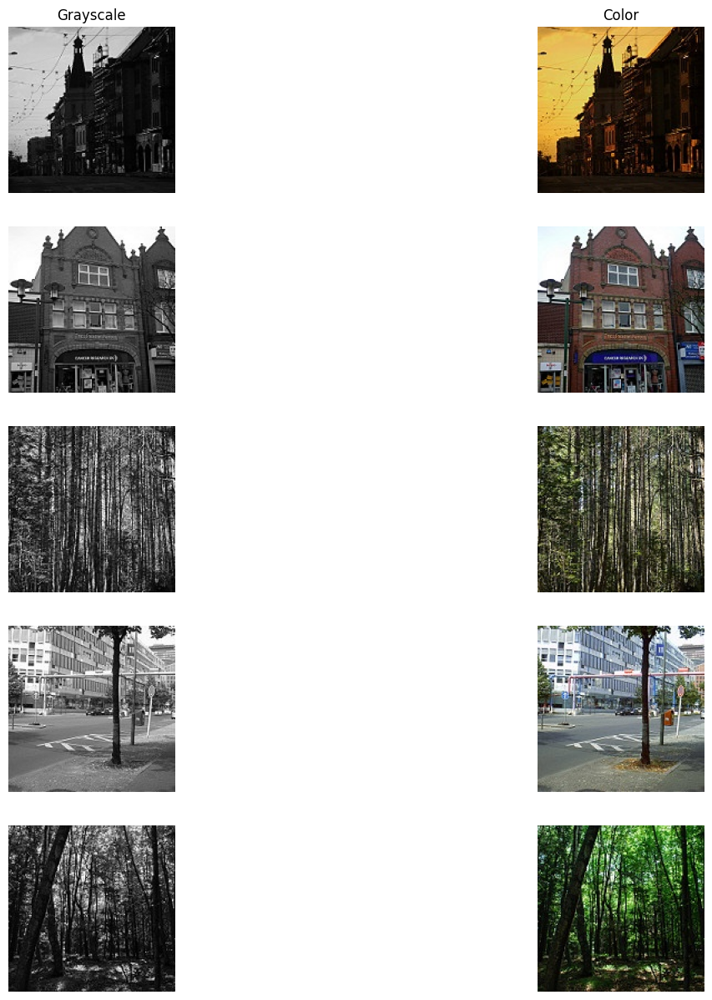

In [15]:
# Visualize some images

def show_images (color, gray):
    fig, axs = plt.subplots (5, 2, figsize=(15, 15))
    axs [0, 0].set_title('Grayscale')
    axs [0, 1].set_title('Color')
    for i in range(5):
        axs[i, 0].imshow(gray[i].permute (1,2,0), cmap='gray')
        axs[i, 0].axis('off')
        axs [i, 1].imshow(color[i].permute (1,2,0))
        axs[i, 1].axis('off')
    plt.show()

color, gray = next(iter(trainloader))
show_images(color, gray)

In [44]:
[26] # Training Variables

EPOCHS = 3
LEARNING_RATE = 0.001
MOMENTUM = 0.9
DEVICE= 'cuda' if torch.cuda.is_available() else 'cpu'

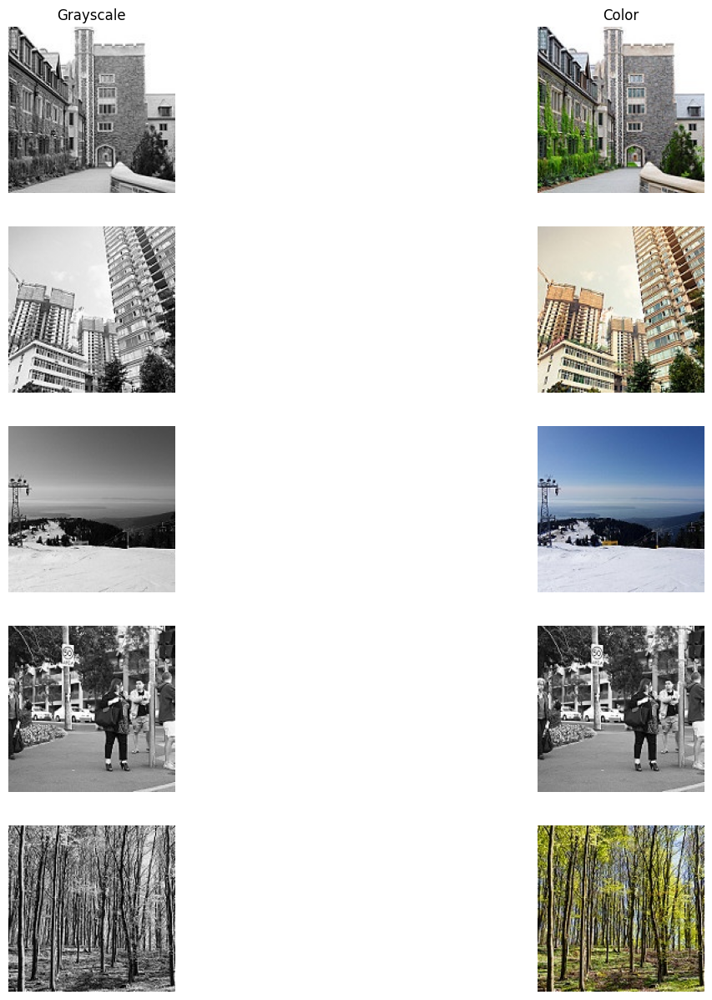

In [45]:
# Visualize some images

def show_images (color, gray):
    fig, axs = plt.subplots (5, 2, figsize=(15, 15))
    axs [0, 0].set_title('Grayscale')
    axs [0, 1].set_title('Color')
    for i in range(5):
        axs[i, 0].imshow(gray[i].permute (1,2,0), cmap='gray')
        axs[i, 0].axis('off')
        axs [i, 1].imshow(color[i].permute (1,2,0))
        axs[i, 1].axis('off')
    plt.show()

color, gray = next(iter(trainloader))
show_images(color, gray)

In [67]:
class ColorAutoEncoder(nn.Module):
  def __init__(self):
    super().__init__()
    #Input shape: Bx1x150x150
    #Conv2d(in_channels, out_channels, kernel_size, stride, padding)

    self.down1 = nn.Conv2d(1, 64, 3, stride=2, )
    self.down2 = nn.Conv2d(64, 128, 3, stride=2, padding=1)
    self.down3 = nn.Conv2d(128, 256, 3, stride=2, padding=1)
    self.down4 = nn.Conv2d(256, 512, 3, stride=2, padding=1)

    self.up1 = nn.ConvTranspose2d(512, 256, 3, stride=2, padding=1)
    self.up2 = nn.ConvTranspose2d(512, 128, 3, stride=2, padding=1)
    self.up3 = nn.ConvTranspose2d(256, 64, 3, stride=2, padding=1, output_padding=1)
    self.up4 = nn.ConvTranspose2d(128, 3, 3, stride=2, output_padding=1)

    self.relu = nn.ReLU()
    self.sigmoid = nn.Sigmoid()

  def forward(self, x):
    # Down sample
    d1 = self.relu(self.down1(x))
    d2 = self.relu(self.down2(d1))
    d3 = self.relu(self.down3(d2))
    d4 = self.relu(self.down4(d3))
    # Upsample
    u1 = self.relu(self.up1 (d4))
    u2 = self.relu(self.up2(torch.cat((u1,d3), dim=1)))
    u3 = self.relu(self.up3(torch.cat((u2, d2), dim=1)))
    u4 = self.sigmoid(self.up4(torch.cat((u3,d1), dim=1)))

    return u4

In [68]:
# Initialize the model
model=ColorAutoEncoder().to (DEVICE)
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
f"Total Number of trainable parameters of this model are: {total_params:,}"

'Total Number of trainable parameters of this model are: 3,470,659'

In [69]:
# Initialize the optimizer and loss function
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=LEARNING_RATE)

In [70]:
for epoch in range(EPOCHS):
    model.train()
    running_loss = 0.0

    for idx, (color_img, gray_img) in tqdm(enumerate(trainloader), total=len(trainloader)):
        color_img = color_img.to(DEVICE)
        gray_img = gray_img.to(DEVICE)

        predictions = model(gray_img)  # Forward pass

        optimizer.zero_grad()
        loss = criterion(predictions, color_img)  # MSELoss expects [0,1] tensors
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    avg_loss = running_loss / len(trainloader)
    print(f"Epoch {epoch + 1}, Avg Loss: {avg_loss:.6f}")

  0%|          | 0/179 [00:00<?, ?it/s]

Epoch 1, Avg Loss: 0.021204


  0%|          | 0/179 [00:00<?, ?it/s]

Epoch 2, Avg Loss: 0.010252


  0%|          | 0/179 [00:00<?, ?it/s]

Epoch 3, Avg Loss: 0.008566


In [71]:
total_loss = 0.0
with torch.no_grad():
  for idx, (color_img, gray_img) in tqdm(enumerate (testloader), total=len(testloader)):
    color_img = color_img.to(DEVICE)
    gray_img = gray_img.to(DEVICE)

    prediction = model(gray_img)

    loss = criterion(prediction, color_img)
    total_loss += loss.item()

print(f"Total Testing loss is: {total_loss/ len(testloader):.3f})")

  0%|          | 0/45 [00:00<?, ?it/s]

Total Testing loss is: 0.008)


Folder exists!
Processing 20 sample images (out of 7129 found):
  - /content/landscape Images/gray/1686.jpg


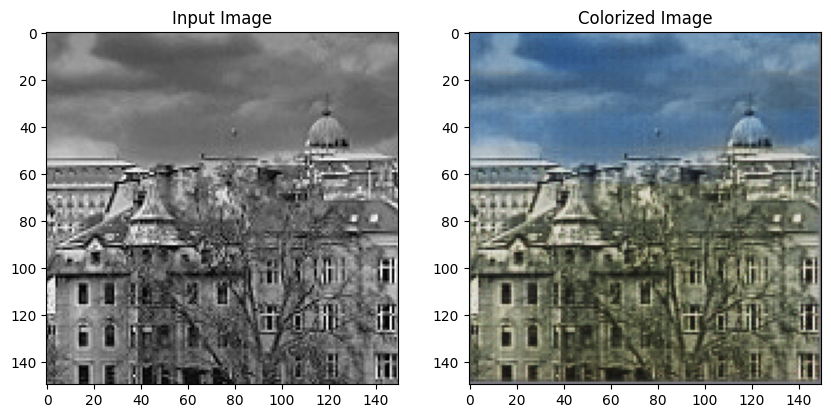

  - /content/landscape Images/gray/5464.jpg


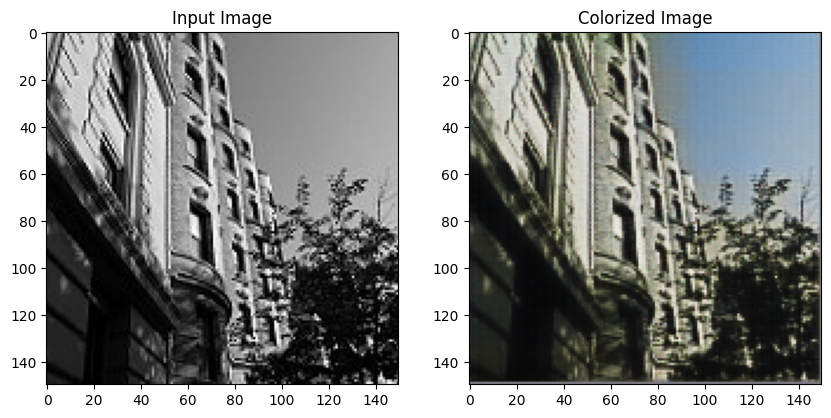

  - /content/landscape Images/gray/5805.jpg


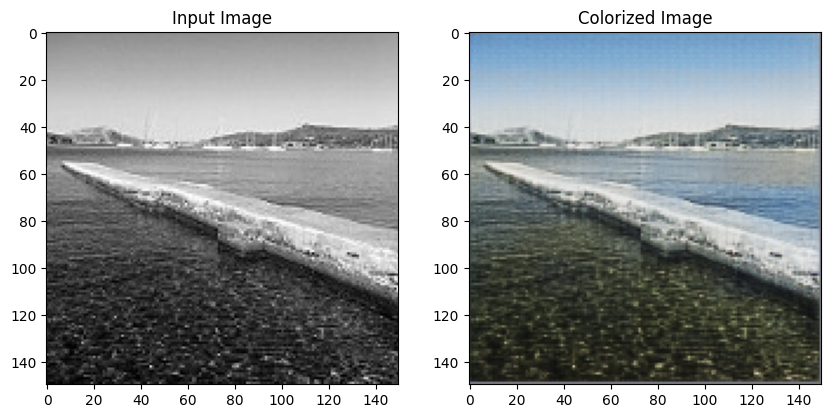

  - /content/landscape Images/gray/5950.jpg


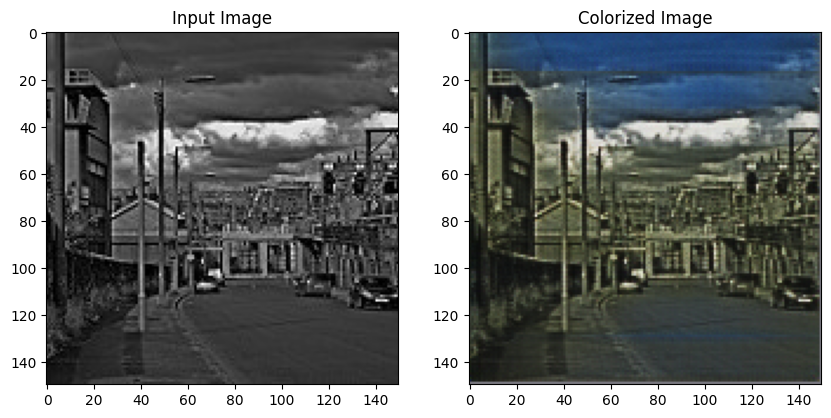

  - /content/landscape Images/gray/4023.jpg


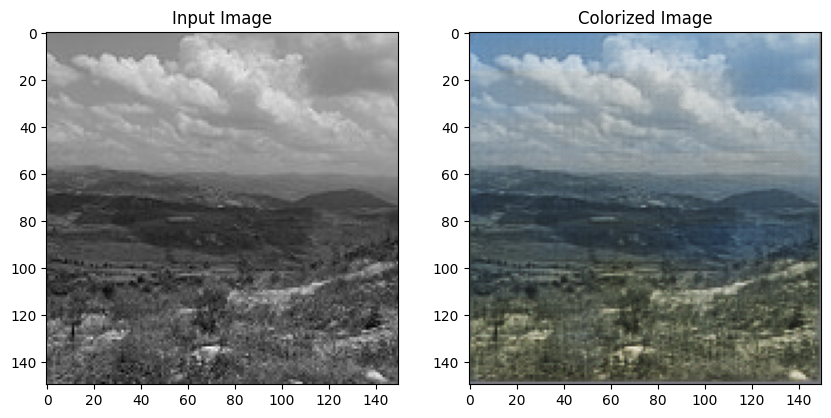

  - /content/landscape Images/gray/4985.jpg


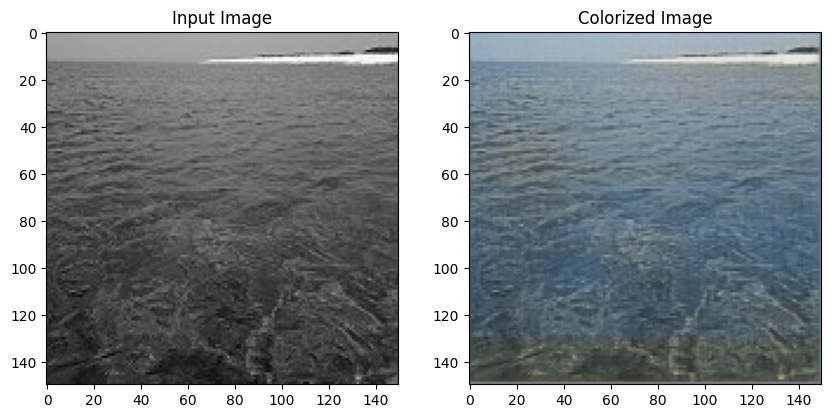

  - /content/landscape Images/gray/1841.jpg


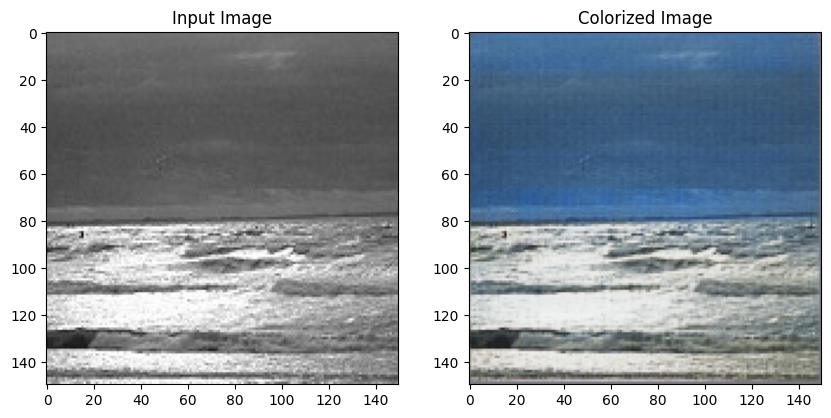

  - /content/landscape Images/gray/5249.jpg


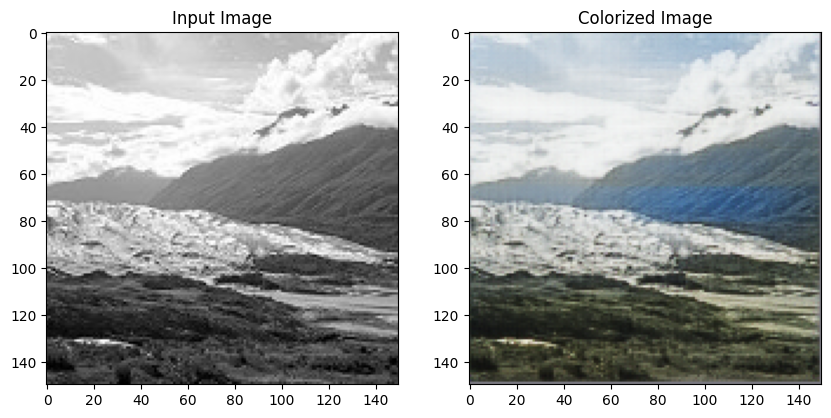

  - /content/landscape Images/gray/145.jpg


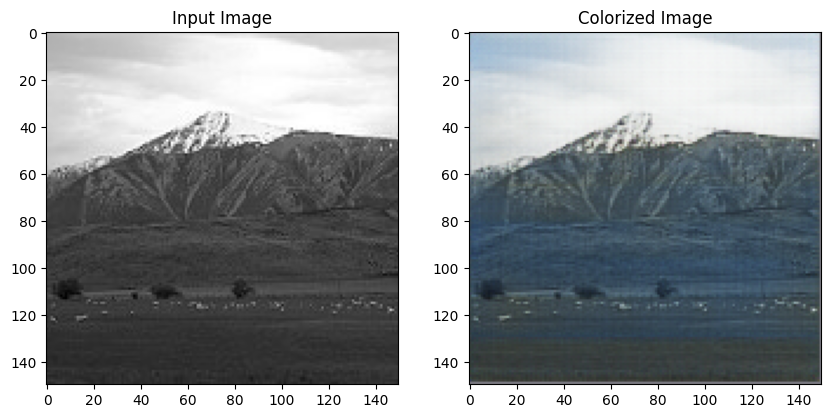

  - /content/landscape Images/gray/1204.jpg


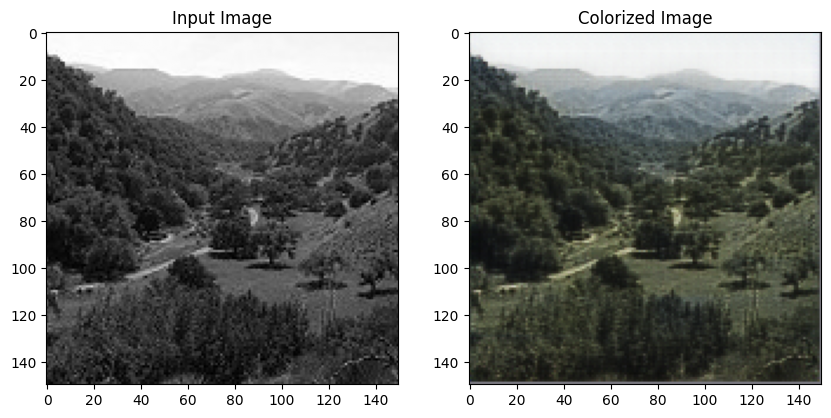

  - /content/landscape Images/gray/3195.jpg


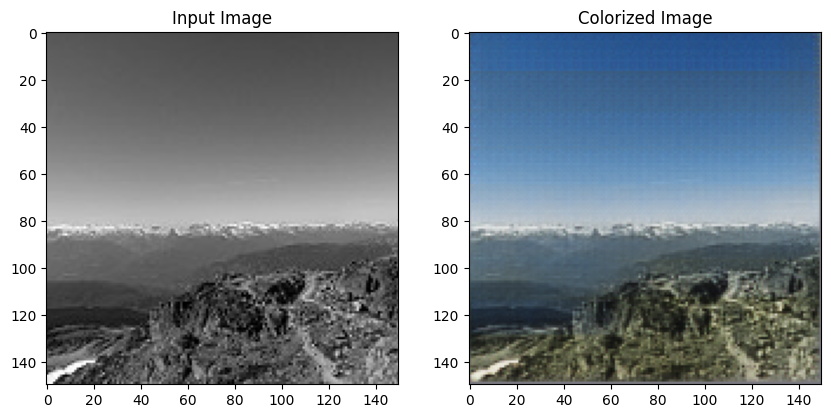

  - /content/landscape Images/gray/20.jpg


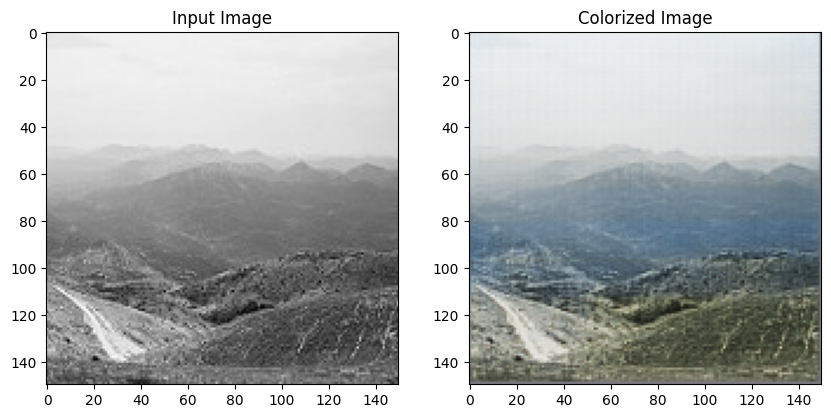

  - /content/landscape Images/gray/4484.jpg


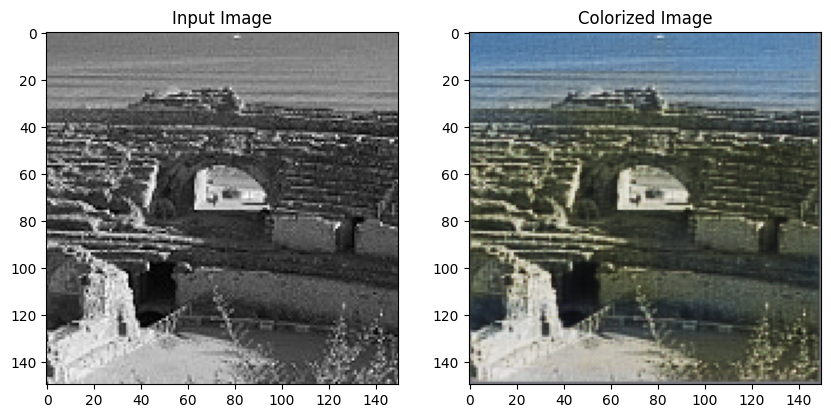

  - /content/landscape Images/gray/4441.jpg


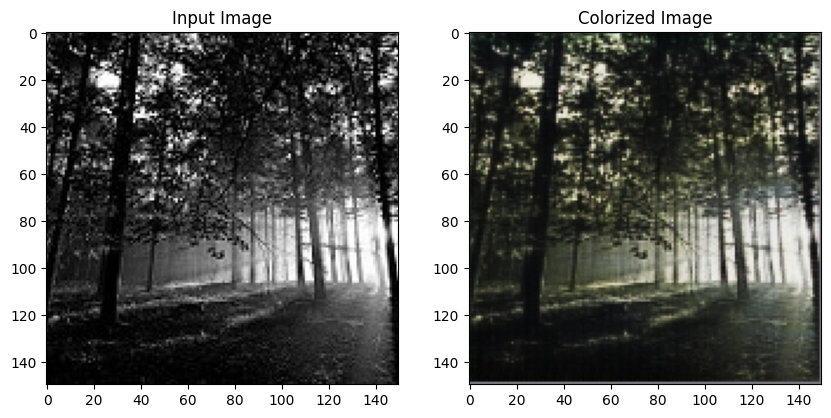

  - /content/landscape Images/gray/1618.jpg


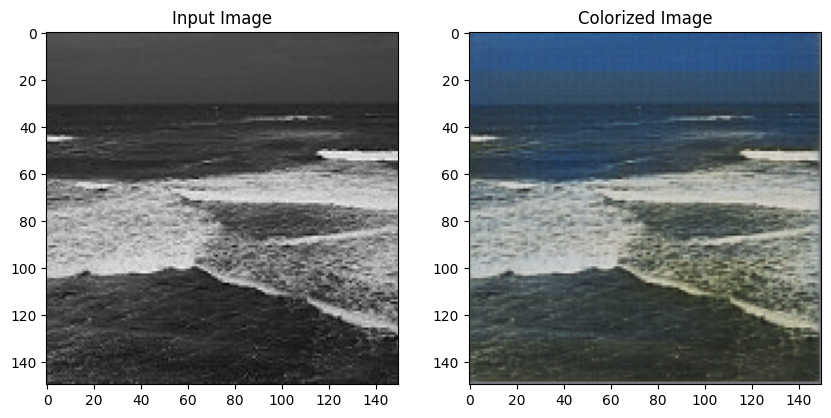

  - /content/landscape Images/gray/6535.jpg


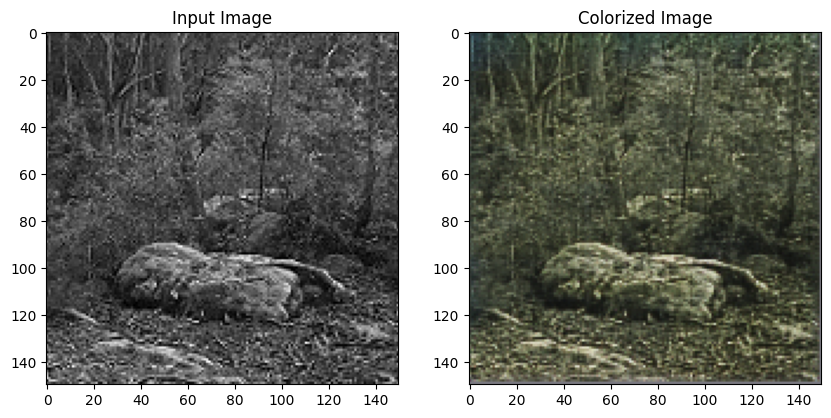

  - /content/landscape Images/gray/4790.jpg


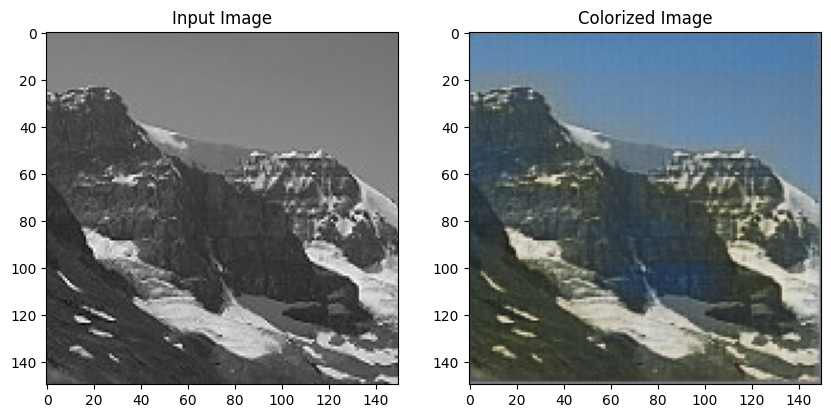

  - /content/landscape Images/gray/1114.jpg


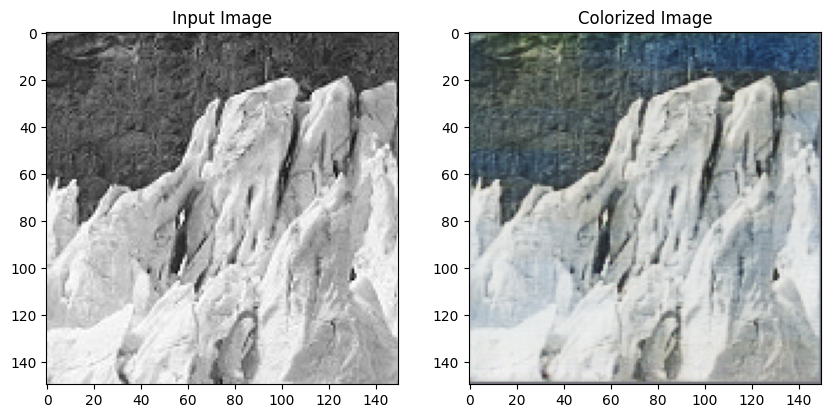

  - /content/landscape Images/gray/618.jpg


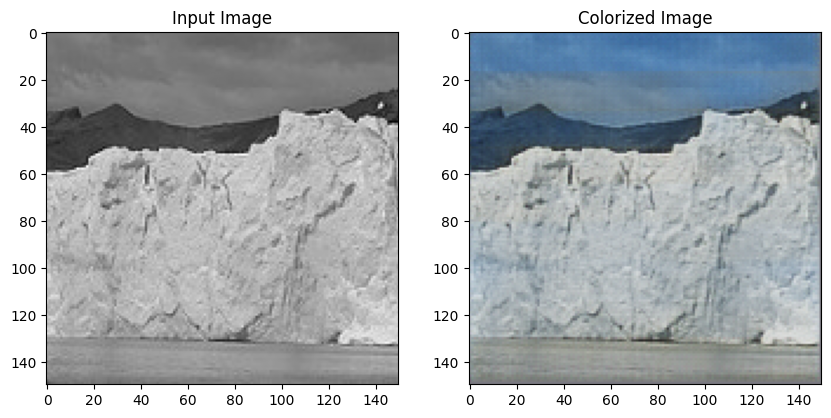

  - /content/landscape Images/gray/5033.jpg


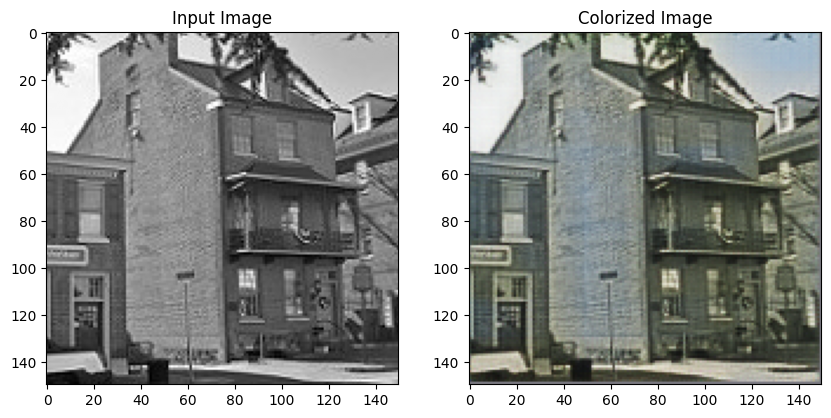

In [72]:
from torchvision.io import read_image
from torchvision import transforms
import matplotlib.pyplot as plt
import os

def colorize_image(image_path):
    """
    Colorizes a grayscale image using the trained model.

    Args:
        image_path (str): Path to the grayscale input image.

    Returns:
        None: Displays the input and colorized images.
    """
    # Load and preprocess the input image
    if not os.path.exists(image_path):
        print(f"Error: File not found at {image_path}")
        return

    input_image = read_image(image_path) / 255  # Normalize to [0, 1]
    transform = transforms.Resize((150, 150), antialias=False)  # Resize
    input_image = transform(input_image)

    # Add a batch dimension (B=1)
    input_image = input_image.unsqueeze(0).to(DEVICE)

    # Get the colorized prediction
    with torch.no_grad():
        output_image = model(input_image)

    # Remove batch dimension and move to CPU
    output_image = output_image.squeeze(0).cpu()
    input_image = input_image.squeeze(0).cpu()

    # Display the images
    fig, axs = plt.subplots(1, 2, figsize=(10, 5))
    axs[0].imshow(input_image.permute(1, 2, 0), cmap='gray')  # Input (grayscale)
    axs[0].title.set_text('Input Image')
    axs[1].imshow(output_image.permute(1, 2, 0))  # Output (colorized)
    axs[1].title.set_text('Colorized Image')
    plt.show()

# Example usage 1: Processing images from a specific folder
image_folder = '/content/landscape Images/gray/'  # Adjust if your folder name is different

# 1. Check if the folder exists
if os.path.exists(image_folder):
    print("Folder exists!")
else:
    print(f"Folder does not exist at {image_folder}! Please check the path.")
    # You might want to stop execution here if the folder doesn't exist
    # import sys; sys.exit(1)

# 2. Get a list of image files in the folder
image_files = [
    f for f in os.listdir(image_folder)
    if os.path.isfile(os.path.join(image_folder, f)) and f.lower().endswith(('.png', '.jpg', '.jpeg'))
]

# 3. Process 20 sample images or all if fewer than 20
num_images_to_process = min(20, len(image_files))

if num_images_to_process == 0:
    print(f"No image files found in the folder {image_folder}.")
else:
    print(f"Processing {num_images_to_process} sample images (out of {len(image_files)} found):")
    for i in range(num_images_to_process):
        image_path = os.path.join(image_folder, image_files[i])
        print(f"  - {image_path}")
        colorize_image(image_path)

In [52]:
!pip install gradio

In [73]:
model.eval()
x = torch.randn(1, 1, 150, 150).to(DEVICE)
with torch.no_grad():
    y = model(x)
print("Output shape:", y.shape)  # Should be [1, 3, 150, 150]

Output shape: torch.Size([1, 3, 150, 150])


In [74]:
!pip install -q gradio

import gradio as gr
import torch
from torchvision import transforms
from PIL import Image

# Device setup
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Ensure the model is already trained and loaded
model = model.to(DEVICE)
model.eval()

# Transform: Grayscale + Resize + ToTensor
transform = transforms.Compose([
    transforms.Grayscale(),         # Force input to 1 channel
    transforms.Resize((150, 150)),
    transforms.ToTensor(),
])

# Gradio interface function
def colorize_image_web(image):
    input_image = transform(image).unsqueeze(0).to(DEVICE)  # [1, 1, 150, 150]

    with torch.no_grad():
        output = model(input_image)  # [1, 3, 150, 150]

    output_image = output.squeeze(0).cpu().clamp(0, 1)       # [3, 150, 150]
    output_pil = transforms.ToPILImage()(output_image)

    return output_pil

# Build and launch interface
demo = gr.Interface(
    fn=colorize_image_web,
    inputs=gr.Image(type="pil", label="Upload Grayscale Image"),
    outputs=gr.Image(type="pil", label="Colorized Output"),
    title="Grayscale Image Colorizer",
    description="Upload a grayscale image and get a colorized result using your trained PyTorch model.",
)

demo.launch(share=True, debug=False)

Colab notebook detected. To show errors in colab notebook, set debug=True in launch()
* Running on public URL: https://529d816436520e3b22.gradio.live

This share link expires in 1 week. For free permanent hosting and GPU upgrades, run `gradio deploy` from the terminal in the working directory to deploy to Hugging Face Spaces (https://huggingface.co/spaces)
